In [47]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import altair as alt

In [101]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [55]:
df = pd.read_csv('Video_Games.csv')

In [57]:
df.head()

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
0,Wii Sports,Wii,2006.0,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,76.0,51.0,8,322.0,Nintendo,E
1,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,NaN,NaN,NaN,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.68,12.76,3.79,3.29,35.52,82.0,73.0,8.3,709.0,Nintendo,E
3,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.61,10.93,3.28,2.95,32.77,80.0,73.0,8,192.0,Nintendo,E
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,NaN,NaN,NaN,NaN,NaN,NaN


In [59]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16719 entries, 0 to 16718
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             16717 non-null  object 
 1   Platform         16719 non-null  object 
 2   Year_of_Release  16450 non-null  float64
 3   Genre            16717 non-null  object 
 4   Publisher        16665 non-null  object 
 5   NA_Sales         16719 non-null  float64
 6   EU_Sales         16719 non-null  float64
 7   JP_Sales         16719 non-null  float64
 8   Other_Sales      16719 non-null  float64
 9   Global_Sales     16719 non-null  float64
 10  Critic_Score     8137 non-null   float64
 11  Critic_Count     8137 non-null   float64
 12  User_Score       10015 non-null  object 
 13  User_Count       7590 non-null   float64
 14  Developer        10096 non-null  object 
 15  Rating           9950 non-null   object 
dtypes: float64(9), object(7)
memory usage: 2.0+ MB


In [61]:
df.describe()

,Year_of_Release,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Count
count,16450.000000,16719.000000,16719.000000,16719.000000,16719.000000,16719.000000,8137.000000,8137.000000,7590.000000
mean,2006.487356,0.263330,0.145025,0.077602,0.047332,0.533543,68.967679,26.360821,162.229908
std,5.878995,0.813514,0.503283,0.308818,0.186710,1.547935,13.938165,18.980495,561.282326
min,1980.000000,0.000000,0.000000,0.000000,0.000000,0.010000,13.000000,3.000000,4.000000
25%,2003.000000,0.000000,0.000000,0.000000,0.000000,0.060000,60.000000,12.000000,10.000000
50%,2007.000000,0.080000,0.020000,0.000000,0.010000,0.170000,71.000000,21.000000,24.000000
75%,2010.000000,0.240000,0.110000,0.040000,0.030000,0.470000,79.000000,36.000000,81.000000
max,2020.000000,41.360000,28.960000,10.220000,10.570000,82.530000,98.000000,113.000000,10665.000000


In [69]:
# Juegos con mayores ventas por mercado
markets = ['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales']
for market in markets:
    print(f"\nTop 10 juegos en {market}")
    print(df.nlargest(10, market)[['Name', market]])

# Géneros más vendidos por mercado
genre_sales = df.groupby('Genre').sum()[markets + ['Global_Sales']]
print("\nVentas por género:")
print(genre_sales.sort_values(by='Global_Sales', ascending=False))

# Publisher líder por mercado
publisher_sales = df.groupby('Publisher').sum()[markets + ['Global_Sales']]
print("\nVentas por publisher:")
print(publisher_sales.sort_values(by='Global_Sales', ascending=False))

# Plataforma líder por mercado
platform_sales = df.groupby('Platform').sum()[markets + ['Global_Sales']]
print("\nVentas por plataforma:")
print(platform_sales.sort_values(by='Global_Sales', ascending=False))


Top 10 juegos en NA_Sales
                         Name  NA_Sales
0                  Wii Sports     41.36
1           Super Mario Bros.     29.08
9                   Duck Hunt     26.93
5                      Tetris     23.20
2              Mario Kart Wii     15.68
3           Wii Sports Resort     15.61
14         Kinect Adventures!     15.00
8   New Super Mario Bros. Wii     14.44
7                    Wii Play     13.96
18          Super Mario World     12.78

Top 10 juegos en EU_Sales
                                            Name  EU_Sales
0                                     Wii Sports     28.96
2                                 Mario Kart Wii     12.76
10                                    Nintendogs     10.95
3                              Wii Sports Resort     10.93
19  Brain Age: Train Your Brain in Minutes a Day      9.20
7                                       Wii Play      9.18
6                          New Super Mario Bros.      9.14
16                            Gran

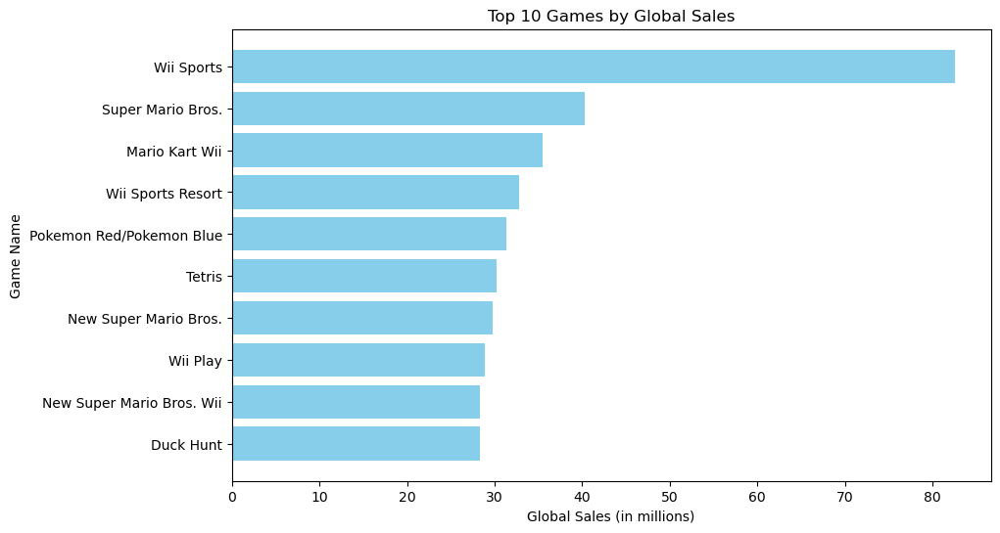

In [71]:
# Top 10 Juegos con mayores ventas globales
top_global_sales = df.nlargest(10, 'Global_Sales')[['Name', 'Global_Sales']]

# Grafico
plt.figure(figsize=(10, 6))
plt.barh(top_global_sales['Name'], top_global_sales['Global_Sales'], color='skyblue')
plt.xlabel('Global Sales (in millions)')
plt.ylabel('Game Name')
plt.title('Top 10 Games by Global Sales')
plt.gca().invert_yaxis()
plt.show()

In [83]:
# Datos: Top 10 juegos por ventas globales
top_global_sales = df.nlargest(10, 'Global_Sales')[['Name', 'Global_Sales']]

# Crear un gráfico de barras con Altair
chart = alt.Chart(top_global_sales).mark_bar().encode(
    x=alt.X('Global_Sales:Q', title='Ventas Globales (millones)'),
    y=alt.Y('Name:N', sort='-x', title='Juegos'),
    color=alt.Color('Global_Sales:Q', scale=alt.Scale(scheme='blues')),
    tooltip=['Name', 'Global_Sales']
).properties(
    title='Top 10 Juegos con Mayores Ventas Globales',
    width=600,
    height=400
)

chart.display()

alt.Chart(...)

In [85]:
# Agrupar datos por mercado y calcular las ventas totales
market_sales = df.melt(
    id_vars='Name', 
    value_vars=['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales'],
    var_name='Market',
    value_name='Sales'
)

# Agrupar por mercado y sumar ventas
market_sales_summary = market_sales.groupby('Market', as_index=False)['Sales'].sum()

# Crear el gráfico 
market_chart = alt.Chart(market_sales_summary).mark_bar().encode(
    x=alt.X('Market:N', title='Mercados'),
    y=alt.Y('Sales:Q', title='Ventas Totales (millones)'),
    color=alt.Color('Market:N', scale=alt.Scale(scheme='category20b')),
    tooltip=['Market', 'Sales']
).properties(
    title='Comparación de Ventas por Mercado',
    width=600,
    height=400
)

market_chart.display()

alt.Chart(...)

In [87]:
genre_sales = df.groupby('Genre').sum().reset_index()

genre_chart = alt.Chart(genre_sales).mark_bar().encode(
    x=alt.X('Global_Sales:Q', title='Ventas Globales (millones)'),
    y=alt.Y('Genre:N', sort='-x', title='Género'),
    color=alt.Color('Global_Sales:Q', scale=alt.Scale(scheme='viridis')),
    tooltip=['Genre', 'Global_Sales']
).properties(
    title='Géneros Más Vendidos a Nivel Global',
    width=600,
    height=400
)

genre_chart.display()

alt.Chart(...)

In [89]:
# Crear una lista de los mercados
markets = ['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales']

# Generar gráficos para cada mercado
charts = []
for market in markets:
    # Top 10 juegos en el mercado actual
    top_market_sales = df.nlargest(10, market)[['Name', market]]
    
    # Gráfico de barras
    chart = alt.Chart(top_market_sales).mark_bar().encode(
        x=alt.X(f'{market}:Q', title=f'Ventas ({market}) en millones'),
        y=alt.Y('Name:N', sort='-x', title='Juegos'),
        color=alt.Color(f'{market}:Q', scale=alt.Scale(scheme='blues')),
        tooltip=['Name', market]
    ).properties(
        title=f'Top 10 Juegos por Ventas en {market}',
        width=600,
        height=400
    )
    
    charts.append(chart)

# Mostrar gráficos para todos los mercados
for chart in charts:
    chart.display()

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

In [135]:
# Limpiar los nulos en Genre
df_clean_genre = df.dropna(subset=['Genre'])

# Preparar datos limpios con melt
genre_sales_clean = df_clean_genre.melt(
    id_vars='Genre',
    value_vars=['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales'],
    var_name='Market',
    value_name='Sales'
)

# Crear el gráfico apilado
stacked_chart_clean = alt.Chart(genre_sales_clean).mark_bar().encode(
    x=alt.X('sum(Sales):Q', title='Ventas Totales (millones)'),
    y=alt.Y('Genre:N', sort='-x', title='Género'),
    color=alt.Color('Market:N', scale=alt.Scale(scheme='set1')),  # Paleta de colores bien diferenciada
    tooltip=['Genre:N', 'Market:N', 'sum(Sales):Q']
).properties(
    title='Comparación de Ventas por Género en Cada Mercado (Limpio)',
    width=800,
    height=500
)

stacked_chart_clean.display()



alt.Chart(...)

In [139]:
# Crear gráfico de dispersión (scatter) con tamaño representando ventas
scatter_chart_clean = alt.Chart(genre_sales_clean).mark_circle(size=300).encode(
    x=alt.X('Market:N', title='Mercados'),
    y=alt.Y('Genre:N', title='Géneros'),
    size=alt.Size('sum(Sales):Q', title='Ventas Totales (millones)'),
    color=alt.Color('Market:N', scale=alt.Scale(scheme='tableau10')),  # Colores vibrantes
    tooltip=['Genre:N', 'Market:N', 'sum(Sales):Q']
).properties(
    title='Diferencias de Ventas por Género y Mercado',
    width=800,
    height=500
).interactive()

scatter_chart_clean.display()

alt.Chart(...)

In [141]:
# Preparar los datos con melt
platform_sales_clean = df.melt(
    id_vars='Platform', 
    value_vars=['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales'],
    var_name='Market',
    value_name='Sales'
)

# Crear gráfico apilado
stacked_chart_platform = alt.Chart(platform_sales_clean).mark_bar().encode(
    x=alt.X('sum(Sales):Q', title='Ventas Totales (millones)'),
    y=alt.Y('Platform:N', sort='-x', title='Plataformas'),
    color=alt.Color('Market:N', scale=alt.Scale(scheme='set2')),  # Colores distintos
    tooltip=['Platform:N', 'Market:N', 'sum(Sales):Q']
).properties(
    title='Comparación de Ventas por Plataforma y Mercado',
    width=800,
    height=500
)

stacked_chart_platform.display()

alt.Chart(...)

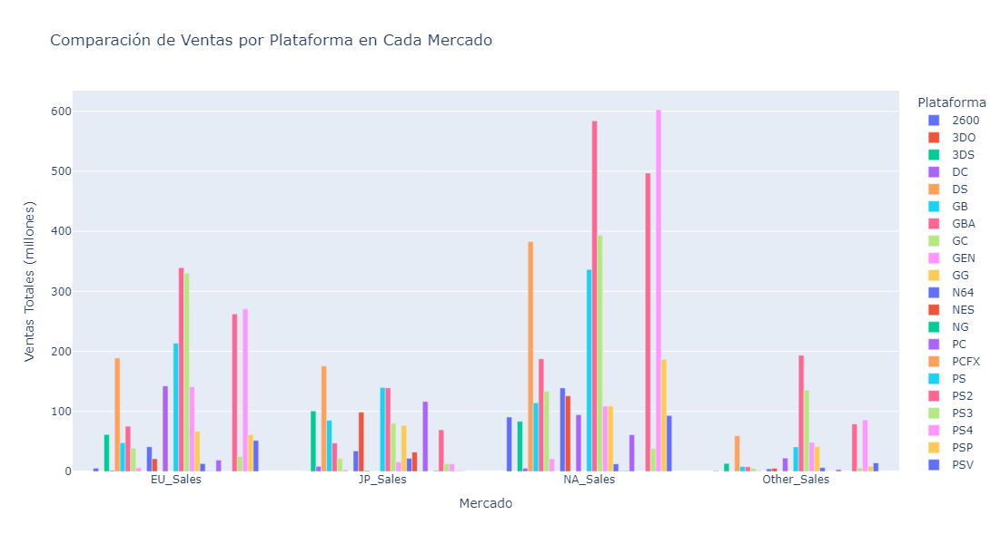

In [157]:
import plotly.express as px

# Crear un gráfico interactivo
fig = px.bar(
    platform_sales_grouped,
    x='Market',
    y='Sales',
    color='Platform',
    barmode='group',
    title='Comparación de Ventas por Plataforma en Cada Mercado',
    labels={'Sales': 'Ventas Totales (millones)', 'Market': 'Mercado', 'Platform': 'Plataforma'}
)

# Configurar diseño del gráfico
fig.update_layout(
    xaxis_title='Mercado',
    yaxis_title='Ventas Totales (millones)',
    legend_title='Plataforma',
    width=900,
    height=600
)

# Mostrar el gráfico
fig.show()

In [182]:
# Filtrar datos completos en Critic_Score y User_Score
clean_scores = df.dropna(subset=['Critic_Score', 'User_Score']).copy()

# Convertir Critic_Score y User_Score a numérico
clean_scores['Critic_Score'] = pd.to_numeric(clean_scores['Critic_Score'], errors='coerce')
clean_scores['User_Score'] = pd.to_numeric(clean_scores['User_Score'], errors='coerce')

# Eliminar filas con valores nulos restantes
clean_scores = clean_scores.dropna(subset=['Critic_Score', 'User_Score'])

# Confirmar tipos de datos
print(clean_scores[['Critic_Score', 'User_Score']].dtypes)

# Confirmar que no hay nulos
print(clean_scores[['Critic_Score', 'User_Score']].isnull().sum())

Critic_Score    float64
User_Score      float64
dtype: object
Critic_Score    0
User_Score      0
dtype: int64


In [184]:
# Calcular correlaciones entre puntajes y ventas
correlation_matrix = clean_scores[['Critic_Score', 'User_Score', 'Global_Sales']].corr()

# Mostrar la matriz de correlación
print(correlation_matrix)

              Critic_Score  User_Score  Global_Sales
Critic_Score      1.000000    0.580878      0.236953
User_Score        0.580878    1.000000      0.088583
Global_Sales      0.236953    0.088583      1.000000


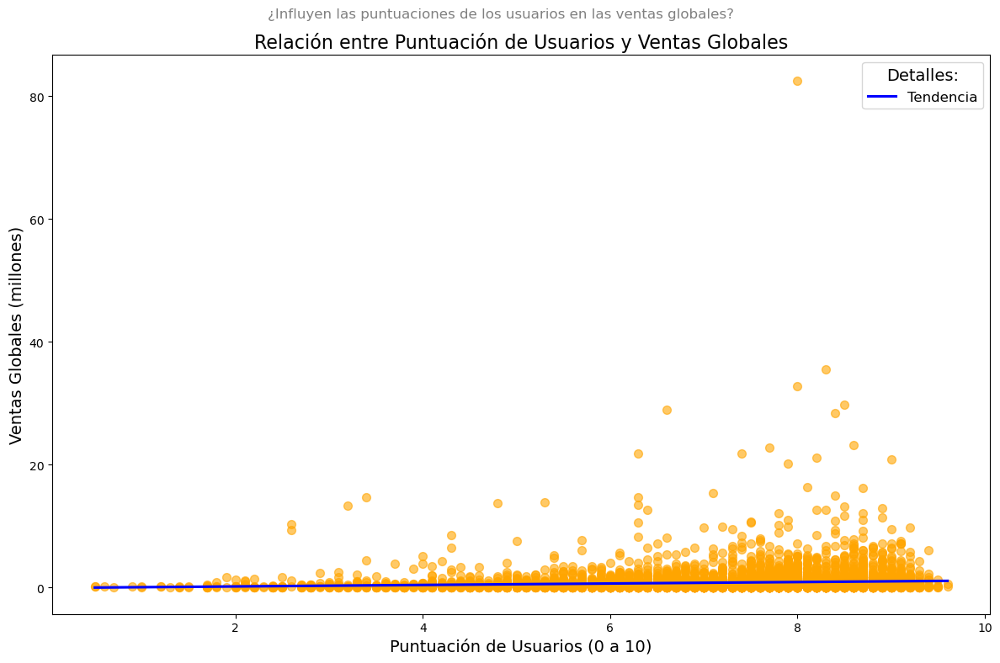

In [190]:
# Configuración del gráfico
plt.figure(figsize=(12, 8))

# Gráfico de dispersión con línea de tendencia
sns.regplot(
    data=clean_scores,
    x='User_Score',
    y='Global_Sales',
    scatter_kws={'alpha': 0.6, 'color': 'orange', 's': 50},  # Transparencia y tamaño
    line_kws={'color': 'blue', 'label': 'Tendencia'}
)

# Título y subtítulo
plt.title('Relación entre Puntuación de Usuarios y Ventas Globales', fontsize=16)
plt.suptitle('¿Influyen las puntuaciones de los usuarios en las ventas globales?', fontsize=12, color='gray')
plt.xlabel('Puntuación de Usuarios (0 a 10)', fontsize=14)
plt.ylabel('Ventas Globales (millones)', fontsize=14)

# Leyenda
plt.legend(title='Detalles:', fontsize=12, title_fontsize=14)

# Mostrar el gráfico
plt.tight_layout()
plt.show()

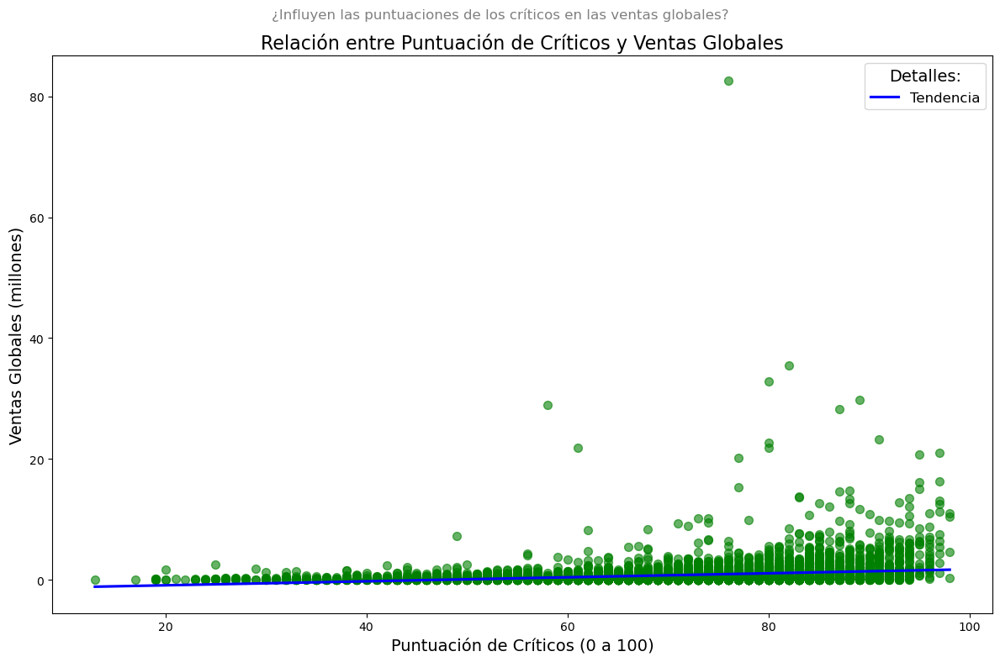

In [192]:
# Configuración del gráfico
plt.figure(figsize=(12, 8))

# Gráfico de dispersión con línea de tendencia
sns.regplot(
    data=clean_scores,
    x='Critic_Score',
    y='Global_Sales',
    scatter_kws={'alpha': 0.6, 'color': 'green', 's': 50},  # Transparencia y tamaño
    line_kws={'color': 'blue', 'label': 'Tendencia'}
)

# Título y subtítulo
plt.title('Relación entre Puntuación de Críticos y Ventas Globales', fontsize=16)
plt.suptitle('¿Influyen las puntuaciones de los críticos en las ventas globales?', fontsize=12, color='gray')
plt.xlabel('Puntuación de Críticos (0 a 100)', fontsize=14)
plt.ylabel('Ventas Globales (millones)', fontsize=14)

# Leyenda
plt.legend(title='Detalles:', fontsize=12, title_fontsize=14)

# Mostrar el gráfico
plt.tight_layout()
plt.show()

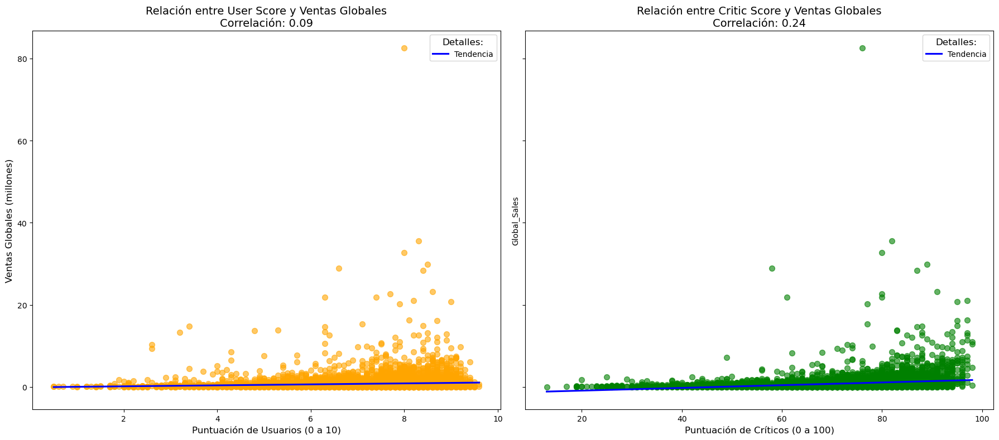

In [194]:
# Calcular correlaciones
correlation_user = clean_scores[['User_Score', 'Global_Sales']].corr().iloc[0, 1]
correlation_critic = clean_scores[['Critic_Score', 'Global_Sales']].corr().iloc[0, 1]

# Configuración de la figura
fig, axes = plt.subplots(1, 2, figsize=(18, 8), sharey=True)

# Gráfico 1: Relación entre User_Score y Global_Sales
sns.regplot(
    data=clean_scores,
    x='User_Score',
    y='Global_Sales',
    scatter_kws={'alpha': 0.6, 'color': 'orange', 's': 50},
    line_kws={'color': 'blue', 'label': 'Tendencia'},
    ax=axes[0]
)
axes[0].set_title(f'Relación entre User Score y Ventas Globales\nCorrelación: {correlation_user:.2f}', fontsize=14)
axes[0].set_xlabel('Puntuación de Usuarios (0 a 10)', fontsize=12)
axes[0].set_ylabel('Ventas Globales (millones)', fontsize=12)
axes[0].legend(title='Detalles:', fontsize=10, title_fontsize=12)

# Gráfico 2: Relación entre Critic_Score y Global_Sales
sns.regplot(
    data=clean_scores,
    x='Critic_Score',
    y='Global_Sales',
    scatter_kws={'alpha': 0.6, 'color': 'green', 's': 50},
    line_kws={'color': 'blue', 'label': 'Tendencia'},
    ax=axes[1]
)
axes[1].set_title(f'Relación entre Critic Score y Ventas Globales\nCorrelación: {correlation_critic:.2f}', fontsize=14)
axes[1].set_xlabel('Puntuación de Críticos (0 a 100)', fontsize=12)
axes[1].legend(title='Detalles:', fontsize=10, title_fontsize=12)

# Ajustar el diseño
plt.tight_layout()
plt.show()

La correlación entre las puntuaciones de los usuarios y las ventas globales de los videojuegos es muy baja, con un valor de 0.09. Esto indica que las opiniones de los usuarios tienen poca influencia directa en el desempeño comercial de los juegos. Esta relación débil puede atribuirse a la subjetividad de las opiniones de los usuarios, que tienden a variar ampliamente según gustos personales y contextos culturales. Además, factores externos como la popularidad de la franquicia, las campañas de marketing, y las ventas iniciales basadas en preventas probablemente desempeñen un papel mucho más importante en las ventas globales que las puntuaciones de los usuarios.

Por otro lado, la correlación entre las puntuaciones de los críticos y las ventas globales es más significativa, con un valor de 0.24. Aunque todavía es una relación moderada, sugiere que los juegos que reciben mejores evaluaciones de los críticos tienden a tener un mejor desempeño comercial. Esto puede deberse a que las opiniones de los críticos son percibidas como más objetivas y confiables por los consumidores, quienes pueden utilizarlas como referencia al decidir qué juegos comprar. Además, los juegos con altas puntuaciones suelen recibir mayor cobertura mediática y apoyo de las distribuidoras, lo que amplifica su visibilidad y, por ende, sus ventas.

La calidad percibida por críticos influye más que las opiniones de los usuarios.

In [201]:
# Recalcular las correlaciones entre Critic_Score, User_Score y las ventas por mercado
markets = ['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales']
correlation_by_market = []

for market in markets:
    correlation_by_market.append({
        'Market': market,
        'Critic_Score_Correlation': clean_scores[['Critic_Score', market]].corr().iloc[0, 1],
        'User_Score_Correlation': clean_scores[['User_Score', market]].corr().iloc[0, 1],
    })

# Convertir los resultados en un DataFrame
correlation_by_market_df = pd.DataFrame(correlation_by_market)

# Imprimir los resultados
print(correlation_by_market_df)

        Market  Critic_Score_Correlation  User_Score_Correlation
0     NA_Sales                  0.233367                0.086496
1     EU_Sales                  0.212023                0.055573
2     JP_Sales                  0.146175                0.127103
3  Other_Sales                  0.191105                0.057359


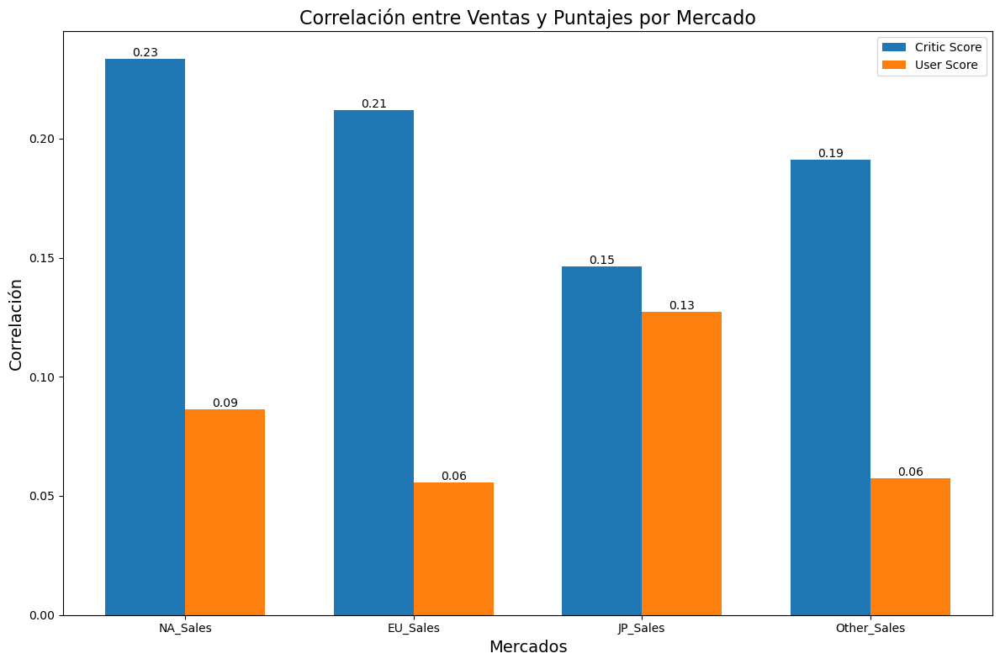

In [203]:
# Configuración del gráfico
x = np.arange(len(markets))  # Posiciones en el eje X
width = 0.35  # Ancho de las barras

# Crear barras para Critic_Score y User_Score
fig, ax = plt.subplots(figsize=(12, 8))
bars1 = ax.bar(x - width/2, correlation_by_market_df['Critic_Score_Correlation'], width, label='Critic Score')
bars2 = ax.bar(x + width/2, correlation_by_market_df['User_Score_Correlation'], width, label='User Score')

# Etiquetas y título
ax.set_xlabel('Mercados', fontsize=14)
ax.set_ylabel('Correlación', fontsize=14)
ax.set_title('Correlación entre Ventas y Puntajes por Mercado', fontsize=16)
ax.set_xticks(x)
ax.set_xticklabels(markets)
ax.legend()

# Añadir valores sobre las barras
for bars in [bars1, bars2]:
    for bar in bars:
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height(),
            f'{bar.get_height():.2f}',
            ha='center',
            va='bottom',
            fontsize=10
        )

plt.tight_layout()
plt.show()

In [205]:
from sklearn.linear_model import LinearRegression
import numpy as np

# Ajustar modelos lineales por mercado
market_models = {}

for market in markets:
    X = clean_scores[['Critic_Score', 'User_Score']].values  # Variables predictoras
    y = clean_scores[market].values.reshape(-1, 1)  # Variable objetivo

    model = LinearRegression()
    model.fit(X, y)
    market_models[market] = {
        'model': model,
        'coefficients': model.coef_,
        'intercept': model.intercept_,
        'score': model.score(X, y)  # R^2 para evaluar el ajuste
    }

# Mostrar resultados de los modelos
for market, data in market_models.items():
    print(f"Mercado: {market}")
    print(f"Coeficientes: {data['coefficients']}")
    print(f"Intercepto: {data['intercept']}")
    print(f"R^2: {data['score']:.2f}\n")

Mercado: NA_Sales
Coeficientes: [[ 0.01905593 -0.04917024]]
Intercepto: [-0.59622344]
R^2: 0.06

Mercado: EU_Sales
Coeficientes: [[ 0.01327407 -0.04807136]]
Intercepto: [-0.35413653]
R^2: 0.05

Mercado: JP_Sales
Coeficientes: [[0.0022352  0.01255556]]
Intercepto: [-0.18425015]
R^2: 0.02

Mercado: Other_Sales
Coeficientes: [[ 0.00457373 -0.01497751]]
Intercepto: [-0.13220417]
R^2: 0.04



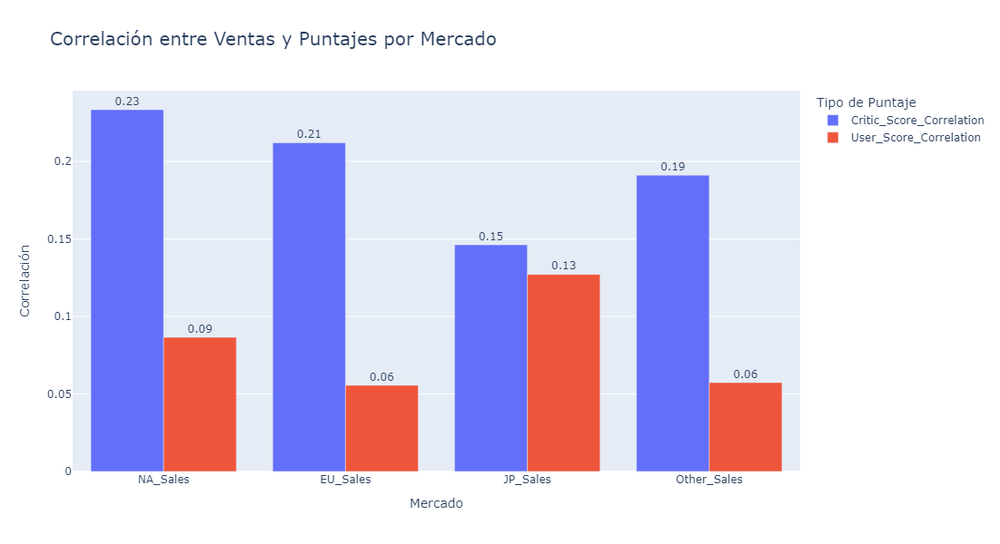

In [209]:
# Preparar datos para Plotly
correlation_plot_data = correlation_by_market_df.melt(
    id_vars='Market', 
    value_vars=['Critic_Score_Correlation', 'User_Score_Correlation'], 
    var_name='Score Type', 
    value_name='Correlation'
)

# Crear gráfico interactivo
fig = px.bar(
    correlation_plot_data,
    x='Market',
    y='Correlation',
    color='Score Type',
    barmode='group',
    title='Correlación entre Ventas y Puntajes por Mercado',
    labels={'Correlation': 'Correlación', 'Market': 'Mercado', 'Score Type': 'Tipo de Puntaje'},
    text='Correlation'
)

# Ajustar diseño
fig.update_traces(texttemplate='%{text:.2f}', textposition='outside')
fig.update_layout(
    xaxis_title='Mercado',
    yaxis_title='Correlación',
    legend_title='Tipo de Puntaje',
    title_font_size=20,
    width=900,
    height=600
)

# Mostrar gráfico
fig.show()